# Notebook 5: Energy Efficiency in Electric Cars

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import re
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
data = pd.read_csv('datasets/Energy.csv')

In [3]:
data

,dcosId,userId,vehicle_model,vehicle_maxChgRate,siteId,stationId,connectTime,startChargeTime,defaultDeadline,Deadline,...,sch_centsPerKwh,sch_centsPerOverstayHr,Duration,DurationHrs,choice,cumEnergy,peakPower,power,lastUpdate,slrpPaymentId
0,24,605,500e,6600,23,7,2020-11-05T10:30:16,2020-11-05T10:31:09,1969-12-31T16:00:00,Null,...,15.0,200.0,0 days 03:43:57,3.732500,REGULAR,3281,6335,[[1604601308 6259]\n [1604601606 6...,2020-11-05T14:15:06,6b108a9e64224989135baca2cffa2c596359c45ef2c0f0...
1,26,486,Model 3,24000,23,3,2020-11-11T07:39:55,2020-11-11T07:39:59,2020-11-12T03:11:00,Null,...,15.0,200.0,0 days 06:50:07,6.835278,REGULAR,33458,7005,[[1605109206 0]\n [1605109506 6...,2020-11-11T14:30:06,7e40611ff8f81771592628312547eedede36157d5aee63...
2,30,620,Volt (second generation upgraded),3600,25,12,2020-11-13T16:19:55,2020-11-13T16:20:06,2020-11-14T04:11:00,2020-11-14T04:15:00,...,12.0,300.0,0 days 20:40:02,20.667222,SCHEDULED,15216,3450,[[1605313212 0]\n [1605313507 3...,2020-11-14T13:00:08,5475d7bfb9fdca49e239f14c88bc0ac50a8a26976a3e44...
3,31,618,Bolt EV,7200,23,6,2020-11-14T23:47:06,2020-11-14T23:47:16,1969-12-31T16:00:00,Null,...,18.0,400.0,0 days 02:12:51,2.214167,REGULAR,14378,6889,[[1605426607 6889]\n [1605426907 6...,2020-11-15T02:00:07,add3a0ba4ca2d77670c3d08bbfb1c0903774c48d08d305...
4,32,623,B-Class Electric Drive,6000,23,9,2020-11-16T11:38:44,2020-11-16T11:42:22,2020-11-17T04:11:00,Null,...,NaN,NaN,0 days 03:12:45,3.212500,REGULAR,12484,6852,[[1605555907 6813]\n [1605556207 6...,2020-11-16T14:55:07,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
908,1471,888,Leaf,7000,25,13,2021-11-07T12:40:06,2021-11-07T12:40:13,2021-11-08T09:00:00,Null,...,0.0,300.0,0 days 01:49:55,1.831944,REGULAR,6760,3919,[[1636317908 3914]\n [1636318208 3...,2021-11-07T14:30:08,81c4e5736b48e33a98313753be7af680dbc3153d899716...
909,1472,902,"Model 3, SR+",170000,25,11,2021-11-07T14:12:38,2021-11-07T14:13:20,2021-11-08T12:00:00,Null,...,0.0,300.0,0 days 00:41:48,0.696667,REGULAR,4220,6744,[[1636323607 6736]\n [1636323908 6...,2021-11-07T14:55:08,04485ab473ed8a25c1d8cfb2ca49cd05209685c711f77c...
910,1473,999,Leaf,7000,25,13,2021-11-07T17:59:03,2021-11-07T17:59:16,1969-12-31T16:00:00,Null,...,NaN,NaN,0 days 03:50:51,3.847500,REGULAR,8761,6572,[[1636336807 3031]\n [1636337107 6...,2021-11-07T21:50:07,NaN
911,1475,627,Kona,75000,25,15,2021-11-08T07:57:57,2021-11-08T07:58:04,2021-11-08T16:15:00,Null,...,0.0,300.0,0 days 01:27:03,1.450833,REGULAR,9032,6665,[[1636387208 6665]\n [1636387508 6...,2021-11-08T09:25:07,7ac0c21c8eabc198eac9dbe5fd47f9377d7c483ccfd398...


Here is a breakdown of the dataframe above and what each column represents. 


|Column Name   | Description |
|--------------|---------|
|dcosId | Unique ID for charging session |
|userId| Unique ID for user |
|vehicle_model | Model name of vehicle |
|vehicle_maxChgRate | Maximum charge rate for the PEV|
|siteId | Unique ID for SlrpEV site (siteId = 23: UCSD Osler Lot, siteId = 25: UC Berkeley) |
|stationId|Unique ID for station at site (for ucsd: 3, 4, 5, 6, 7, 8, 9, 10; for ucb: 11, 12, 13, 14, 15, 16, 17 18)|
|connectTime| Timestamp (local time) when the user plugs into station |
|startChargeTime |Timestamp (local time) when the EVSE starts delivering power |
|defaultDeadline| Timestamp (local time) for the user’s default departure time |
|Deadline | Timestamp (local time) of the departure time indicated by the user when they select SCHEDULED, using the "Departure Time“ slider. This is NOT their actual departure time.|
|energyReq |Energy requested (in Watt-hours) by user  |
|estCost | Estimate of the cost (USD) paid by the user, |
|reg_centsPerHr | Offered price for REGULAR, in cents per hour |
|sch_centsPerHr | Offered price for SCHEDULED, in cents per hour |
|sch_centsPerKwh | Offered price for SCHEDULED, in cents per kWh |
|sch_centsPerOverstayHr |Fee for duration the user stays connected beyond their indicated departure time, in cents per hours. Only applies to SCHEDULED  |
|Duration | Duration of session |
|DurationHrs | Duration of session (hours) |
|choice | Charging service option selected by user (REGULAR or SCHEDULED |
|cumEnergy | Cumulative energy delivered by the EVSE (in Watt-hours) |
|peakPower | Peak power delivered by the EVSE (inf-norm over time) (in Watts) |
|power |  |
|lastUpdate | Timestamp of most recent update when charging session was active (datetime). |
|slrpPaymentId | Unique ID for payment details, |

<br>

# Popularity of EV Models

Let's take a look at the popularity of different EV models is the data set. We can use the `.value_counts()` method to look at counts of categorical data like types of EVs. We'll also turn the result into a dataframe and select only the top 10 most popular EV models in the data.

In [4]:
data["vehicle_model"].value_counts().to_frame().head(10)

,vehicle_model
Prius Prime,164
Model 3,125
Bolt EV,106
Kona,69
Clarity,61
Model X 100 Dual,42
Volt (second generation),40
B-Class Electric Drive,36
Mustang Mach-E,26
Model S 100 Dual,20


4.722719058050382


<AxesSubplot:>

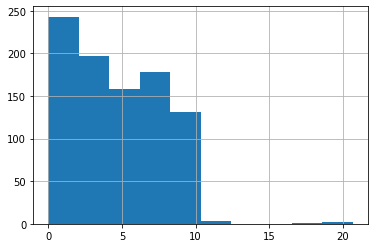

In [5]:
# Hist of duration in hours
print(data["DurationHrs"].mean())
data["DurationHrs"].hist()

In [6]:
%matplotlib inline
plt.rcParams['figure.figsize'] = (16,8)
plt.rcParams['figure.dpi'] = 150

<AxesSubplot:>

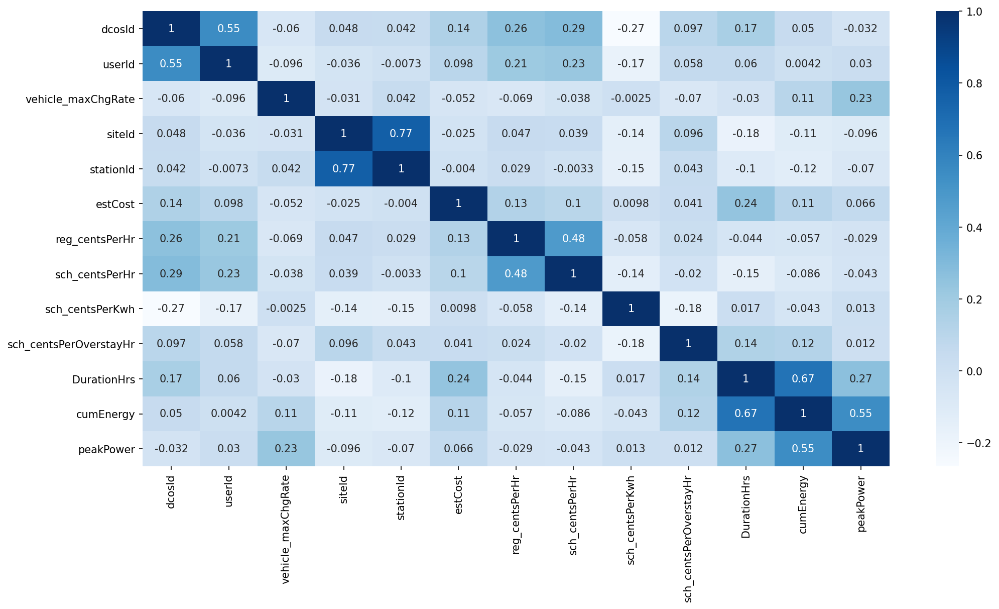

In [7]:
corr = data.corr()
sns.heatmap(corr, cmap="Blues", annot=True)

In [8]:
#! pip install pandas-profiling
import pandas_profiling

In [9]:
data.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<br>

# Station Popularity

Data exploration that focuses on station popularity.

In [10]:
energy_data = pd.read_csv("Module 5_ Energy.csv")

In [11]:
essential_cols = energy_data[['siteId', 'stationId']]

The unique Id's for stations
- ucsd: 3, 4, 5, 6, 7, 8, 9, 10
- ucb: 11, 12, 13, 14, 15, 16, 17 18

In [12]:
# Group by station Id's
group_by_station = essential_cols.groupby('stationId')['stationId'].count().reset_index(name="count")
group_by_station

,stationId,count
0,3,2
1,4,11
2,5,2
3,6,3
4,7,60
5,8,47
6,9,56
7,10,26
8,11,122
9,12,128


Here are the top stations in UC Berkeley and UC San Diego.

## UC Berkeley

In [13]:
ucb = [11, 12, 13, 14, 15, 16, 17, 18]
ucb_stations = group_by_station[group_by_station.stationId.isin(ucb)].sort_values('count', ascending = False)
ucb_stations

,stationId,count
10,13,136
9,12,128
8,11,122
12,15,113
13,16,87
14,17,80
15,18,33
11,14,7


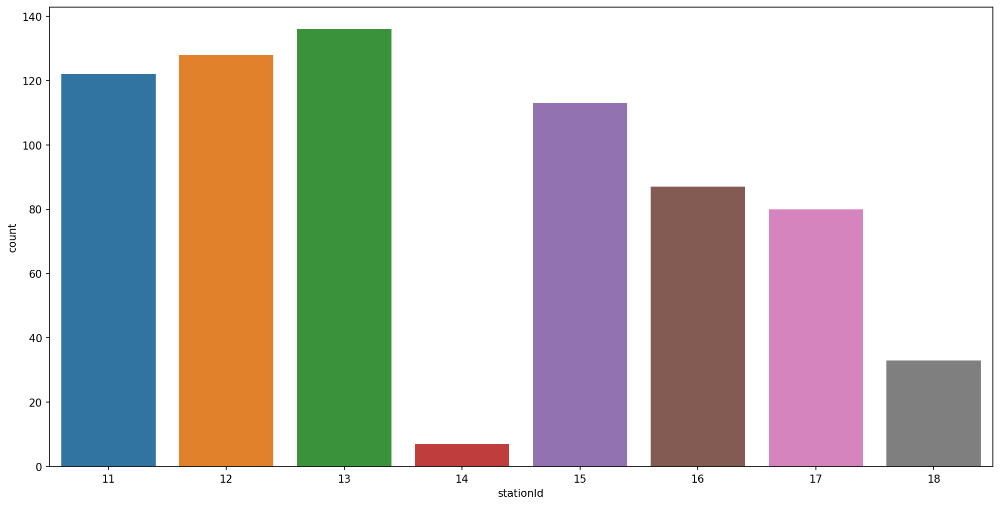

In [14]:
sns.barplot(x="stationId", y="count", data=ucb_stations);

Station number 13 is the most popular station in UC Berkeley.

## UC San Diego

In [15]:
ucsd = [ 3, 4, 5, 6, 7, 8, 9, 10]
ucsd_stations = group_by_station[group_by_station.stationId.isin(ucsd)].sort_values('count', ascending = False)
ucsd_stations

,stationId,count
4,7,60
6,9,56
5,8,47
7,10,26
1,4,11
3,6,3
0,3,2
2,5,2


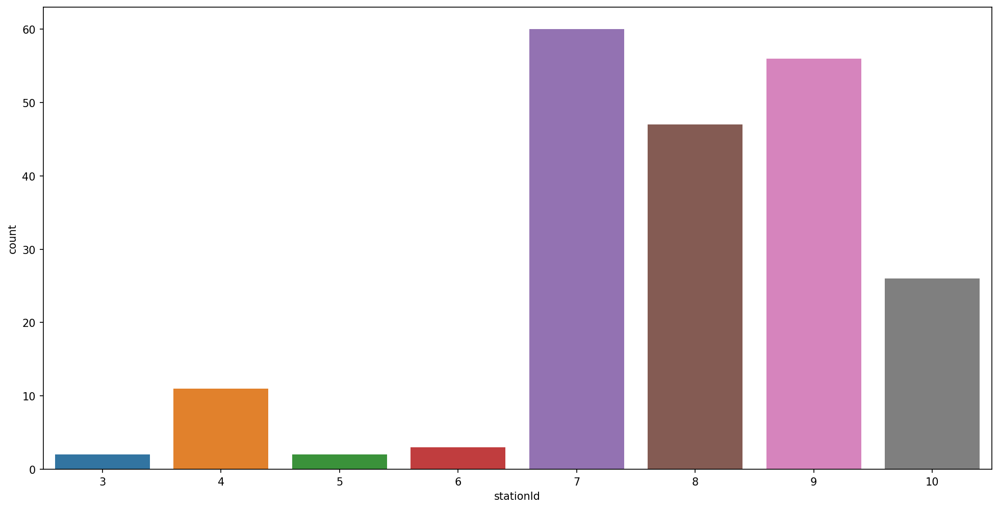

In [16]:
sns.barplot(x="stationId", y="count", data=ucsd_stations);

Station number 7 is the most popular station at UC San Diego.

<br>

# UCB/UCSD energy consumption comparison

In [17]:
site_energy = energy_data[['stationId', 'cumEnergy']].groupby('stationId').agg(sum)
site_energy

,cumEnergy
stationId,
3,42936
4,110771
5,24582
6,44186
7,1208896
8,1066901
9,1538053
10,562712
11,2825986


In [18]:
ucb_energy = site_energy[site_energy.index.isin(ucb)]
ucsd_energy = site_energy[site_energy.index.isin(ucsd)]
ucb_energy

,cumEnergy
stationId,
11,2825986
12,2353501
13,2040497
14,15520
15,1945219
16,1871138
17,974761
18,494398


In [19]:
ucb_cumEnergy = sum(ucb_energy['cumEnergy'])
ucb_cumEnergy

12521020

In [20]:
ucsd_cumEnergy = sum(ucsd_energy['cumEnergy'])
ucsd_cumEnergy

4599037

In [21]:
#Compare number of unique users
users = energy_data[['stationId', 'userId']]
users

,stationId,userId
0,7,605
1,3,486
2,12,620
3,6,618
4,9,623
...,...,...
908,13,888
909,11,902
910,13,999
911,15,627


In [22]:
ucb_users = users[users['stationId'].isin(ucb)]
ucsd_users = users[users['stationId'].isin(ucsd)]
ucb_users

,stationId,userId
2,12,620
5,11,589
6,13,589
7,14,589
8,15,589
...,...,...
908,13,888
909,11,902
910,13,999
911,15,627


In [23]:
#Observe charging frequency of users
ucb_users['userId'].value_counts()

603    108
746     69
721     42
627     40
683     37
      ... 
800      1
782      1
758      1
675      1
902      1
Name: userId, Length: 67, dtype: int64

In [24]:
ucsd_users['userId'].value_counts()

748     28
610     22
486     17
701     16
717     10
897      9
830      9
745      9
685      8
983      7
973      6
491      5
644      4
908      4
991      3
821      3
895      3
881      3
937      3
684      3
857      3
810      3
623      2
455      2
1007     2
984      1
987      1
967      1
447      1
990      1
648      1
982      1
617      1
931      1
605      1
960      1
818      1
858      1
814      1
768      1
750      1
736      1
709      1
649      1
639      1
606      1
618      1
1013     1
Name: userId, dtype: int64

In [25]:
#Find unique number of users in each school
unique_ucb = len(ucb_users.groupby('userId'))
unique_ucb

67

In [26]:
unique_ucsd = len(ucsd_users.groupby('userId'))
unique_ucsd

48

In [27]:
#Total charges for each school
tot_ucb_users = len(ucb_users)
tot_ucsd_users = len(ucsd_users)

In [28]:
ucb_cumEnergy/tot_ucb_users

17735.155807365438

In [29]:
ucsd_cumEnergy/tot_ucsd_users

22217.57004830918

<br>

Created by Aaron Moore, Chuyi Shang, Melisa Esqueda, Kinsey Long & Karalyn Chong